---

******


# 🚖 🚧 ▶ **PROJET UBER** ◀ 	🚧	🚖

##### **Doriane DOYON-DOUSSE** : *Certification bloc 3* ✅  (**ds_fs_od_03** 📖)

******

## **Importation librairies** 💫

° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° °

In [127]:
import requests
import io
import zipfile

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

import plotly.express as px
import plotly.io as pio
pio.renderers.default = "colab"
import plotly.figure_factory as ff
import plotly.graph_objects as go

from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans, DBSCAN

from math import *

## **Lecture of the Dataset** 📚

° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° °

In [128]:
# Downloading the dataset
url = "https://full-stack-bigdata-datasets.s3.eu-west-3.amazonaws.com/Machine+Learning+non+Supervis%C3%A9/Projects/uber-trip-data.zip"

response = requests.get(url)
response.raise_for_status()

In [129]:
with zipfile.ZipFile(io.BytesIO(response.content)) as zip_file:
  with zip_file.open('uber-trip-data/uber-raw-data-apr14.csv') as file:
    uber_april = pd.read_csv(file)

---

# 🔷 **Exploratory Data Analysis (EDA)** 📁

° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° °

In [130]:
print('********************************************************************************************')
print('***************** U B E R   D A T A S E T   I N F O S  (14th of April) *********************')
print('********************************************************************************************')
print()
print()

print('---------- Shape of the dataset : ----------')
print()
print(f'Number of rows : {uber_april.shape[0]}')
print(f'Number of columns : {uber_april.shape[1]} ')
print()
print()

print('---------- Column Names of Uber Dataset  : ----------')
print()
print(f'Here are the name of the columns : {uber_april.columns}')
print()
print()

print('---------- Display of the dataset  : ---------')
print()
display(uber_april.head())
print()
print()

print('---------- Basic statistical informations  : ---------')
print()
display(uber_april.describe(include='all'))
print()
print()


print('---------- Percentage of missing values : ---------')
print()
print(uber_april.isnull().sum()*100/len(uber_april))
print()
print()


print('---------- Informations about the Dataset : ---------')
print()
print(uber_april.info())


print()
print()
print('********************************************************************************************')
print('********************************************************************************************')

********************************************************************************************
***************** U B E R   D A T A S E T   I N F O S  (14th of April) *********************
********************************************************************************************


---------- Shape of the dataset : ----------

Number of rows : 564516
Number of columns : 4 


---------- Column Names of Uber Dataset  : ----------

Here are the name of the columns : Index(['Date/Time', 'Lat', 'Lon', 'Base'], dtype='object')


---------- Display of the dataset  : ---------



,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512




---------- Basic statistical informations  : ---------



,Date/Time,Lat,Lon,Base
count,564516,564516.000000,564516.000000,564516
unique,41999,NaN,NaN,5
top,4/7/2014 20:21:00,NaN,NaN,B02682
freq,97,NaN,NaN,227808
mean,NaN,40.740005,-73.976817,NaN
std,NaN,0.036083,0.050426,NaN
min,NaN,40.072900,-74.773300,NaN
25%,NaN,40.722500,-73.997700,NaN
50%,NaN,40.742500,-73.984800,NaN
75%,NaN,40.760700,-73.970000,NaN




---------- Percentage of missing values : ---------

Date/Time    0.0
Lat          0.0
Lon          0.0
Base         0.0
dtype: float64


---------- Informations about the Dataset : ---------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 564516 entries, 0 to 564515
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Date/Time  564516 non-null  object 
 1   Lat        564516 non-null  float64
 2   Lon        564516 non-null  float64
 3   Base       564516 non-null  object 
dtypes: float64(2), object(2)
memory usage: 17.2+ MB
None


********************************************************************************************
********************************************************************************************


### All columns seems intelligeable except Bases : let's see what it correspond to ?

In [131]:
# Regrouping Unique Bases
unique_bases = uber_april['Base'].unique()

# Visualizing them
fig = px.bar(unique_bases,
             title="Different Bases in Uber Dataset (14th April)")

fig.update_layout(xaxis_title = 'Bases')

fig.show()

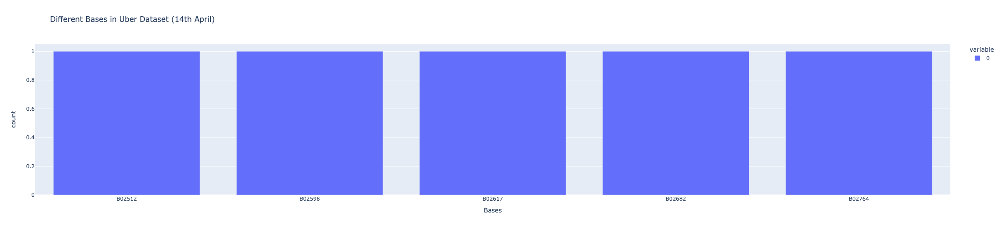

In [1]:
from IPython.display import Image
Image(filename="Graphs/Bases_graph.png")

### **First infos and questions we can have about this dataset** :

*   No missing values in the dataset, so cool
*   4 columns (2 with coordinates, 1 with base and 1 with DataTime infos) + a loooot of rows (564516), it takes memory... Can we reduce the dataset?
*   This datatime columns ---> we need to change from object type to datetime type in order to be able to make further analysis on it
*  Base column ---> Initial base of the car, after visualizing this variable and in relationship to our goal in the project, we will remove it.
*  Impossible de have the describe metho informations about the Date/Time column because of the format problem, changing this will be our first task







## 🔸 **DataTime conversion & Column Creation** ⌛

° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° °

In [132]:
# Conversion from object to datetime

uber_april['Date/Time'] = pd.to_datetime(uber_april['Date/Time'])

In [133]:
uber_april['Date/Time']

0        2014-04-01 00:11:00
1        2014-04-01 00:17:00
2        2014-04-01 00:21:00
3        2014-04-01 00:28:00
4        2014-04-01 00:33:00
                 ...        
564511   2014-04-30 23:22:00
564512   2014-04-30 23:26:00
564513   2014-04-30 23:31:00
564514   2014-04-30 23:32:00
564515   2014-04-30 23:48:00
Name: Date/Time, Length: 564516, dtype: datetime64[ns]

Yay! The conversion worked well

In [134]:
# Creation of Date, Time and Year columns
uber_april['Date'] = uber_april['Date/Time'].dt.date
uber_april['Time'] = uber_april['Date/Time'].dt.time
uber_april['Year'] = uber_april['Date/Time'].dt.year

# Creation of Month numerical and Month Name columns
uber_april['Month_numeric'] = uber_april['Date/Time'].dt.month
uber_april['Month_Name'] = uber_april['Date/Time'].dt.month_name()

# Creation of Day columns : numerical and in letter
uber_april['Day_Name'] = uber_april['Date/Time'].dt.day_name()
uber_april['Day_numeric'] = uber_april['Date/Time'].dt.weekday

# Creation time columns : hour and time
uber_april['Hour'] = uber_april['Date/Time'].dt.hour
uber_april['Minute'] = uber_april['Date/Time'].dt.minute

# Removal of old Dates columns
# ---------------------------------------------------
to_remove = ['Date/Time', 'Base', 'Date']
uber_april = uber_april.drop(columns=to_remove, axis=1)

In [135]:
uber_april.head()

,Lat,Lon,Time,Year,Month_numeric,Month_Name,Day_Name,Day_numeric,Hour,Minute
0,40.7690,-73.9549,00:11:00,2014,4,April,Tuesday,1,0,11
1,40.7267,-74.0345,00:17:00,2014,4,April,Tuesday,1,0,17
2,40.7316,-73.9873,00:21:00,2014,4,April,Tuesday,1,0,21
3,40.7588,-73.9776,00:28:00,2014,4,April,Tuesday,1,0,28
4,40.7594,-73.9722,00:33:00,2014,4,April,Tuesday,1,0,33


## 🔸**Uber pickups demand** 🚨

° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° °

#### *Let's do some visualizations in order to understand Uber Pickups demand in function of different Date and time variables*

In [136]:
uber_april.head()

,Lat,Lon,Time,Year,Month_numeric,Month_Name,Day_Name,Day_numeric,Hour,Minute
0,40.7690,-73.9549,00:11:00,2014,4,April,Tuesday,1,0,11
1,40.7267,-74.0345,00:17:00,2014,4,April,Tuesday,1,0,17
2,40.7316,-73.9873,00:21:00,2014,4,April,Tuesday,1,0,21
3,40.7588,-73.9776,00:28:00,2014,4,April,Tuesday,1,0,28
4,40.7594,-73.9722,00:33:00,2014,4,April,Tuesday,1,0,33


In [137]:
# Visualiazing demands in relationshipwith hour and day of the week
# ------------------------------------------------------------------
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=2,
                    subplot_titles=("Daily Uber Pickups Demand", "Hourly Uber Pickups Demand"))

fig.add_trace(go.Histogram(x=uber_april['Day_Name']), row=1, col=1)
fig.add_trace(go.Histogram(x=uber_april['Hour']), row=1, col=2)

fig.show()

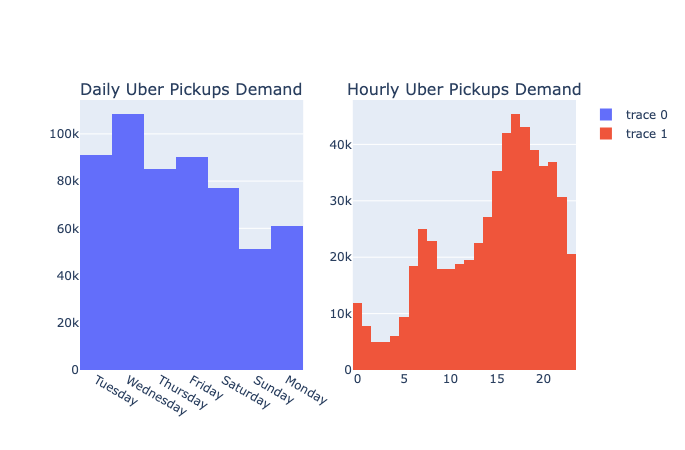

In [2]:
from IPython.display import Image
Image(filename="Graphs/Uber_graph3.png")

## 🔸 **Detailled graphics of Hours Pickups demand** 📊

° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° °

#### Right now let's have a better understanding of how Uber pickups demands are distributed over time : hour by hour

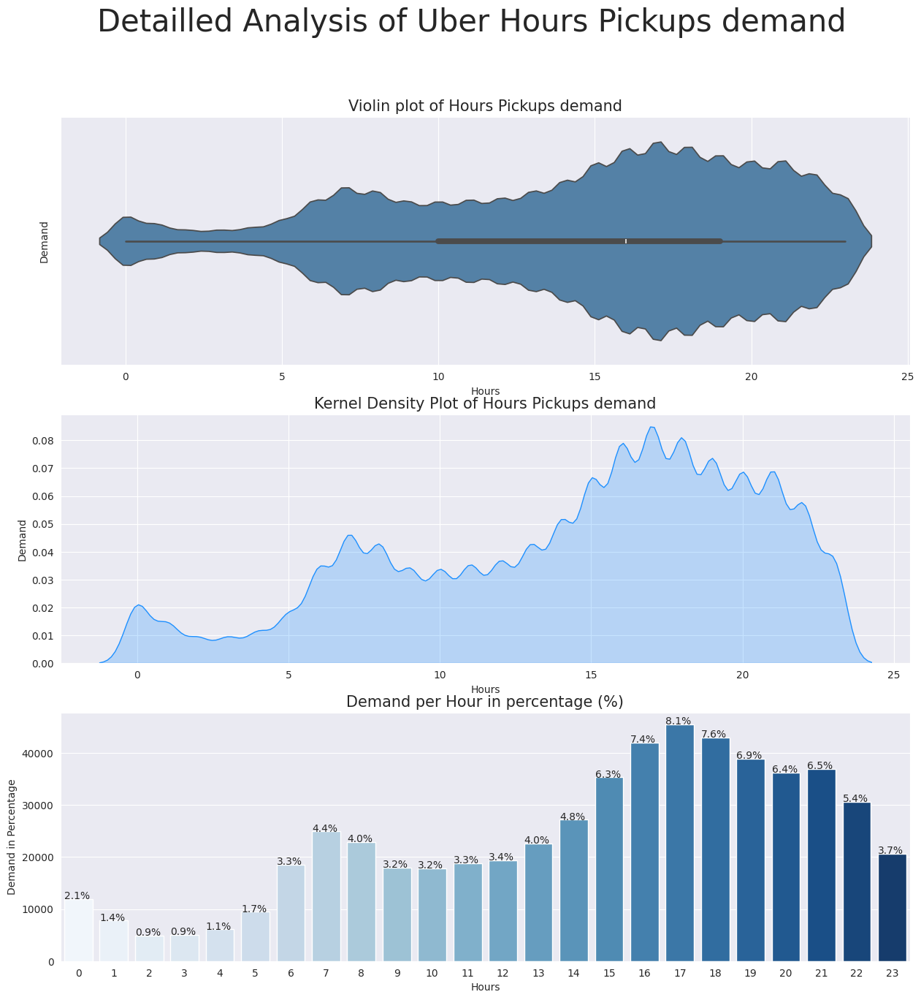

In [138]:
fig, axes = plt.subplots(nrows=3 , ncols=1, figsize=(15,15))
sns.set_style("darkgrid")
fig.suptitle('Detailled Analysis of Uber Hours Pickups demand', fontsize = 30)

# 1st graph
# ---------------------------------------------------------------------------
sns.violinplot(x = uber_april['Hour'], ax=axes[0], color = "steelblue")
axes[0].set_title('Violin plot of Hours Pickups demand', fontsize = 15)
axes[0].set_xlabel('Hours')
axes[0].set_ylabel('Demand')

# 2nd graph : Boxenplot
# ---------------------------------------------------------------------------
sns.kdeplot(x = uber_april['Hour'], color = "dodgerblue", ax=axes[1], shade=True)
axes[1].set_title('Kernel Density Plot of Hours Pickups demand', fontsize = 15)
axes[1].set_xlabel('Hours')
axes[1].set_ylabel('Demand')

# 3rd graph : Countplot
#---------------------------------------------------------------------------
sns.countplot(x = uber_april['Hour'], palette = "Blues", ax=axes[2])

axes[2].set_title('Demand per Hour in percentage (%)', fontsize = 15)
axes[2].set_xlabel('Hours')
axes[2].set_ylabel('Demand in Percentage')

for i in axes[2].patches:
    operation = round(i.get_height()/len(uber_april)*100, 1)
    text = str(operation) + '%'
    text_x = i.get_x()
    text_y = i.get_height()
    axes[2].text(text_x, text_y,text)

## 🔸 **Detailled graphics of Daily Pickups demand** 📊

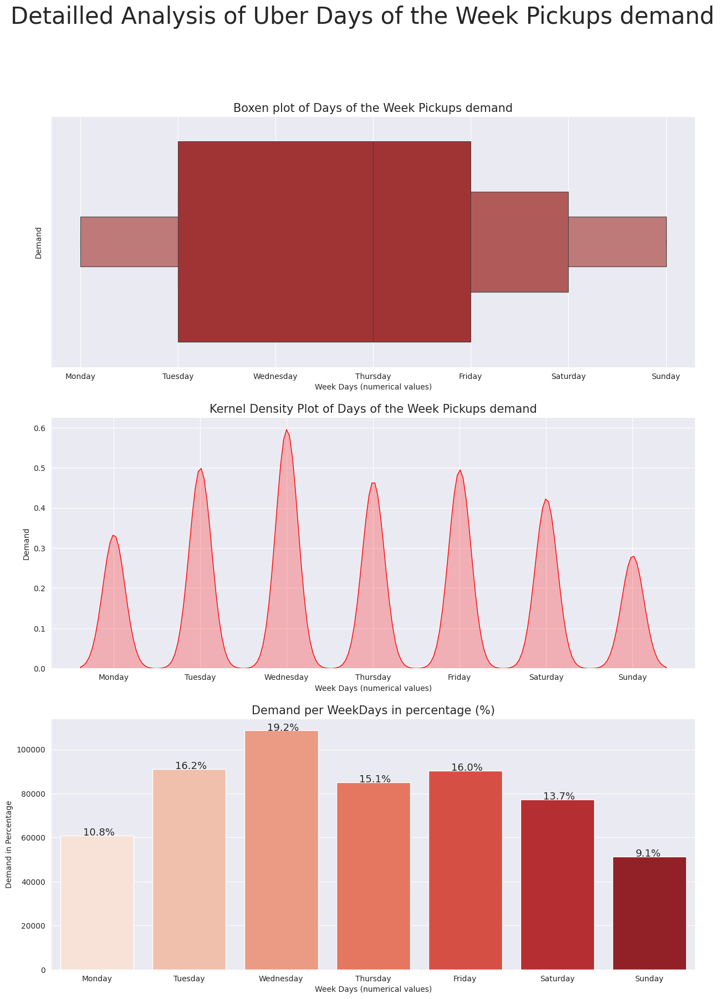

In [139]:
fig, axes = plt.subplots(nrows=3 , ncols=1, figsize=(15,20))
sns.set_style("darkgrid")
fig.suptitle('Detailled Analysis of Uber Days of the Week Pickups demand', fontsize = 30)

# 1st graph
# ---------------------------------------------------------------------------
sns.boxenplot(x = uber_april['Day_numeric'], ax=axes[0], color = "firebrick")
axes[0].set_title('Boxen plot of Days of the Week Pickups demand', fontsize = 15)
axes[0].set_xlabel('Week Days (numerical values)')
axes[0].set_ylabel('Demand')
axes[0].set_xticks([0, 1, 2, 3, 4, 5, 6], ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
       rotation=0, size=10)

# 2nd graph : Boxenplot
# ---------------------------------------------------------------------------
sns.kdeplot(x = uber_april['Day_numeric'], color = "red", ax=axes[1], shade=True)
axes[1].set_title('Kernel Density Plot of Days of the Week Pickups demand', fontsize = 15)
axes[1].set_xlabel('Week Days (numerical values)')
axes[1].set_ylabel('Demand')
axes[1].set_xticks([0, 1, 2, 3, 4, 5, 6], ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
       rotation=0, size=10)

# 3rd graph : Countplot
#---------------------------------------------------------------------------
sns.countplot(x = uber_april['Day_numeric'], palette="Reds", ax=axes[2])

axes[2].set_title('Demand per WeekDays in percentage (%)', fontsize = 15)
axes[2].set_xlabel('Week Days (numerical values)')
axes[2].set_ylabel('Demand in Percentage')
axes[2].set_xticks([0, 1, 2, 3, 4, 5, 6], ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
       rotation=0, size=10)

for i in axes[2].patches:
    operation = round(i.get_height()/len(uber_april)*100, 1)
    text = str(operation) + '%'
    text_x = i.get_x()+0.25
    text_y = i.get_height()
    axes[2].text(text_x, text_y, text, size=13)

### **Interpretation** : ✅
  * *Top 3 days with demand in April where*:
    - 1. Wednesday
    - 2. Tuesday
    - 3. Friday

  * *High demand hours are* :
    - **Morning fever** : Between 6am and 9am (7am morning pick rush hour)
    - **Night big big fever** : from 3pm to 10pm (5pm night pick rush hour)

---

## 🔸 **Visualizing maps of demands** 👀

° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° ° °

#### 📌 **GLOBAL DEMANDS ON 14th APRIL**

In [140]:
uber_april_sample = uber_april.sample(60000)

fig = px.scatter_mapbox(uber_april_sample,
                        lat = 'Lat',
                        lon = 'Lon',
                        color='Hour',
                        mapbox_style='carto-positron',
                        opacity = 0.8,
                        width=900,
                        height=800,
                        zoom=10,
                        title = 'Global Uber Pickups demands in New York City (14th april week)')

fig.show()

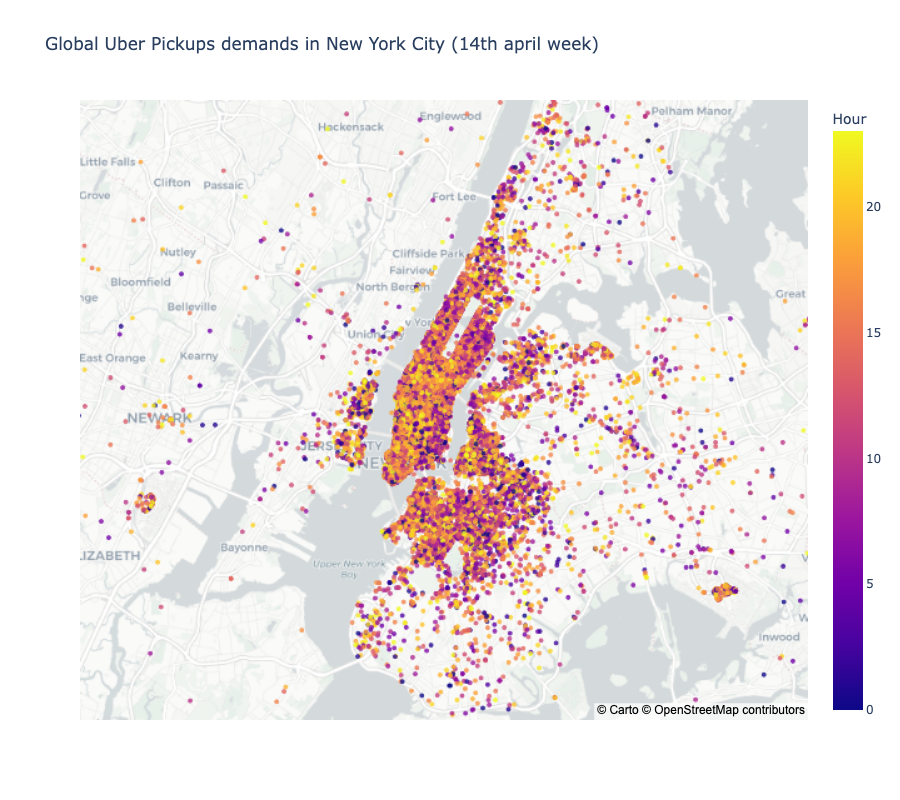

In [3]:
from IPython.display import Image
Image(filename="Graphs/global_map.png")

#### 📌 **HOURLY DEMANDS ON 14th APRIL on Density Mapbox**

In [141]:
uber_april_sample = uber_april.sample(60000)
uber_april_sample = uber_april_sample.sort_values('Hour', ascending=True)

fig2 = px.density_mapbox(uber_april_sample,
                         lat="Lat", lon="Lon", z='Hour',
                         radius=4,
                         animation_frame="Hour",
                         mapbox_style='carto-positron',
                         color_continuous_scale='earth',
                        width=900,
                        height=800,
                        zoom=11,
                         title='Hour repartion of Uber pickups in New York City (April 14th)')
fig2.show()

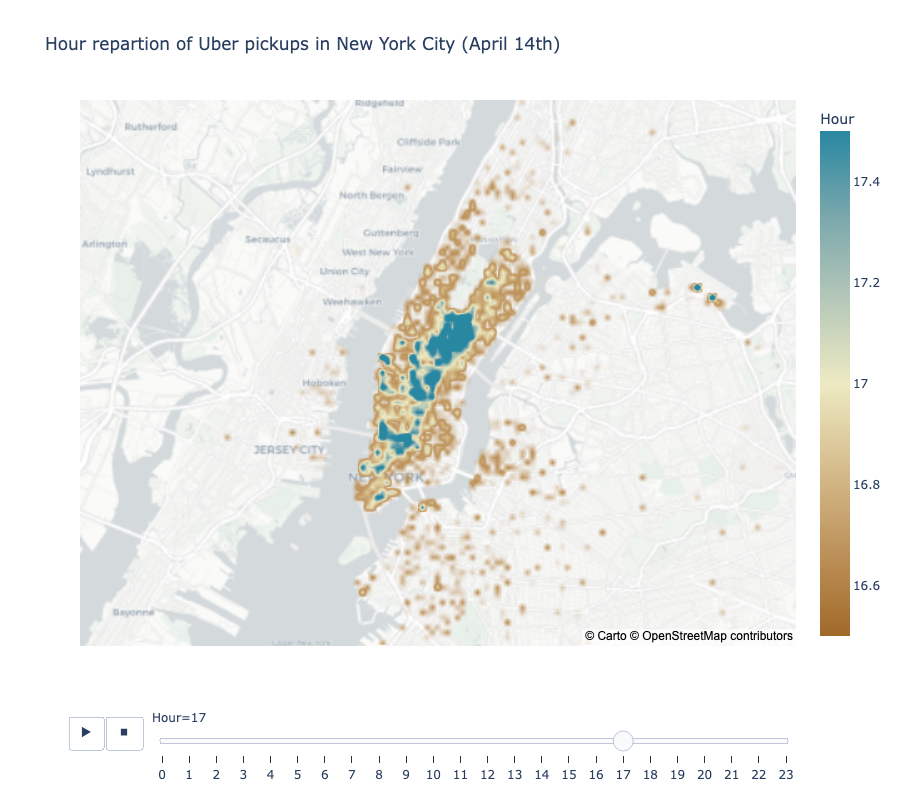

In [4]:
from IPython.display import Image
Image(filename="Graphs/density_map.png")

#### 📌 **WEEKLY DEMANDS ON 14th APRIL on Scatter Mapbox**

In [142]:
uber_april_sample = uber_april.sample(100000, random_state=23)
list_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
day_order = pd.Categorical(uber_april_sample['Day_Name'], categories=list_order)

fig = px.scatter_mapbox(uber_april_sample,
                        lat = 'Lat',
                        lon = 'Lon',
                        color='Hour',
                        animation_frame=day_order,
                        mapbox_style='carto-positron',
                        opacity = 0.9,
                        color_continuous_scale='icefire',
                        width=900,
                        height=800,
                        zoom=10,
                        title = 'Weekly Uber Pickups repartition in New York City(14th april week)')

fig.show()

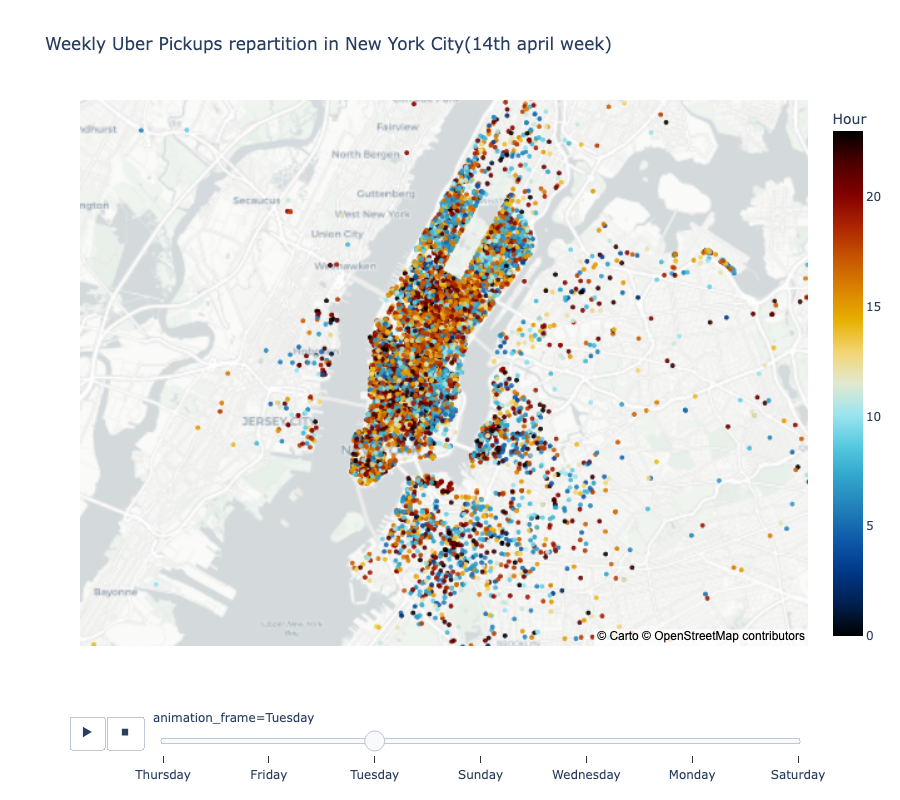

In [5]:
from IPython.display import Image
Image(filename="Graphs/per_day_map.png")

---


# 🔷 **KMeans Algorithm** 🤖

---

##### Taking a small sample of 20000 rows

In [143]:
uber_april_sample2 = uber_april.sample(20000)
print(f'Here the sample of {uber_april_sample2.shape[0]} observation dataset :')
print()
display(uber_april_sample2)

Here the sample of 20000 observation dataset :



,Lat,Lon,Time,Year,Month_numeric,Month_Name,Day_Name,Day_numeric,Hour,Minute
479180,40.7593,-73.9746,21:17:00,2014,4,April,Monday,0,21,17
292487,40.7429,-73.9893,16:45:00,2014,4,April,Tuesday,1,16,45
267969,40.7664,-73.9788,16:56:00,2014,4,April,Monday,0,16,56
500104,40.7522,-73.9818,18:59:00,2014,4,April,Thursday,3,18,59
4303,40.7367,-74.0350,12:00:00,2014,4,April,Friday,4,12,0
...,...,...,...,...,...,...,...,...,...,...
502990,40.7397,-74.0053,00:22:00,2014,4,April,Friday,4,0,22
563790,40.7227,-73.9930,18:57:00,2014,4,April,Tuesday,1,18,57
55337,40.7646,-73.9838,21:34:00,2014,4,April,Friday,4,21,34
38291,40.7102,-73.9845,18:38:00,2014,4,April,Tuesday,1,18,38


In [144]:
#Sub Dataset X selecting Latitude and Longitude columns
X = uber_april_sample2.loc[:, ['Lat', 'Lon']]

print('Subset of the sample Uber dataset with Lon, Lat columns:')
print()
display(X.head())

print()
print('X shape is : ', X.shape)

Subset of the sample Uber dataset with Lon, Lat columns:



,Lat,Lon
479180,40.7593,-73.9746
292487,40.7429,-73.9893
267969,40.7664,-73.9788
500104,40.7522,-73.9818
4303,40.7367,-74.0350



X shape is :  (20000, 2)


## ♦️ ⇢ **NORMALIZATION** 🔢

In [145]:
# Normalization with StandardScaler

print('***********************************************************')
print('*************** N O R M A L I Z A T I O N *****************')
print('***********************************************************')
print()
print()

print('--------- Sub Dataset X before StandardScaler --------')
print()
display(X.head())


print('--------- Sub Dataset X before StandardScaler --------')
print()

scaler = StandardScaler()
X_normalized = scaler.fit_transform(X)

print(X_normalized[0:5])

print()
print()
print('***********************************************************')
print('***********************************************************')

***********************************************************
*************** N O R M A L I Z A T I O N *****************
***********************************************************


--------- Sub Dataset X before StandardScaler --------



,Lat,Lon
479180,40.7593,-73.9746
292487,40.7429,-73.9893
267969,40.7664,-73.9788
500104,40.7522,-73.9818
4303,40.7367,-74.0350


--------- Sub Dataset X before StandardScaler --------

[[ 0.53849677  0.04472586]
 [ 0.08521713 -0.24917661]
 [ 0.73473369 -0.03924628]
 [ 0.34225985 -0.09922637]
 [-0.08614469 -1.16287342]]


***********************************************************
***********************************************************


## 📎 **Finding the optimal K Cluster with Elbow and Silhouette Methods**

Clustering in Unsupervised Learning is totally different from predicting target in Supervised model : we have to keep in mind that there is "no perfect answer" for finding the optimal number of k cluster. So our next task will be to test different numbers of k and see throught visualization what is goinhg to be more adapted

## ♦️ ⇢ **ELBOW METHOD** 💪🏽

In [146]:
# Clustering with KMeans

print('***********************************************************')
print('*************** E L B O W    M E T H O D  *****************')
print('***********************************************************')
print()
print()

inertia_wcss = []
k =[]

for i in range(2, 31):
    kmeans = KMeans(n_clusters=i, n_init='auto', random_state=23)
    kmeans.fit(X_normalized)
    inertia_wcss.append(kmeans.inertia_)
    k.append(i)
    print('---------------------------------------------------')
    print("Inertia (WCSS) for K={} is {}".format(i, inertia_wcss[-1]))

print()
print()
print('***********************************************************')
print('***********************************************************')

***********************************************************
*************** E L B O W    M E T H O D  *****************
***********************************************************


---------------------------------------------------
Inertia (WCSS) for K=2 is 29641.29310935607
---------------------------------------------------
Inertia (WCSS) for K=3 is 19090.52884833139
---------------------------------------------------
Inertia (WCSS) for K=4 is 15454.506844615496
---------------------------------------------------
Inertia (WCSS) for K=5 is 12538.3064373607
---------------------------------------------------
Inertia (WCSS) for K=6 is 9546.175177955789
---------------------------------------------------
Inertia (WCSS) for K=7 is 8533.200565452622
---------------------------------------------------
Inertia (WCSS) for K=8 is 7378.52735416894
---------------------------------------------------
Inertia (WCSS) for K=9 is 5983.017160055744
---------------------------------------------------

In [147]:
inertia_frame = pd.DataFrame(inertia_wcss)
k_frame = pd.Series(k)

fig = px.line(
    inertia_frame,
    x = k_frame,
    y = inertia_frame.iloc[:, -1],
    markers=True
)

fig.update_layout(
    xaxis_title = "Number of Clusters",
    yaxis_title = 'Inertia (WCSS)',
    title='Elbow method : Inertia per Cluster'
)

fig.show('colab')

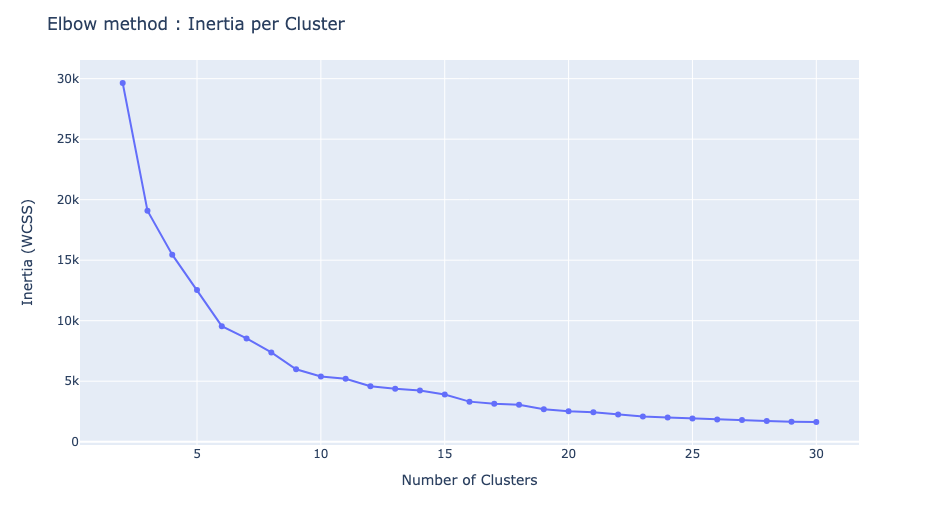

In [6]:
from IPython.display import Image
Image(filename="Graphs/elbow_inertia.png")

## ♦️ ⇢ **SILHOUETTE METHOD**

In [148]:
from sklearn.metrics import silhouette_score

In [149]:
print('***********************************************************')
print('********** S I L H O U E T T E   M E T H O D  *************')
print('***********************************************************')
print()
print()

silhouette = []
k = []

for i in range (2,31):
    kmeans = KMeans(n_clusters= i,n_init='auto', random_state = 0)
    kmeans.fit(X_normalized)
    silhouette.append(silhouette_score(X_normalized, kmeans.predict(X_normalized)))
    k.append(i)
    print('---------------------------------------------------')
    print("Silhouette score for K={} is {}".format(i, silhouette[-1]))

print()
print()
print('***********************************************************')
print('***********************************************************')

***********************************************************
********** S I L H O U E T T E   M E T H O D  *************
***********************************************************


---------------------------------------------------
Silhouette score for K=2 is 0.6102134703167013
---------------------------------------------------
Silhouette score for K=3 is 0.581294054623106
---------------------------------------------------
Silhouette score for K=4 is 0.44025484010286353
---------------------------------------------------
Silhouette score for K=5 is 0.45973384978281917
---------------------------------------------------
Silhouette score for K=6 is 0.47861163992943573
---------------------------------------------------
Silhouette score for K=7 is 0.4852821861705874
---------------------------------------------------
Silhouette score for K=8 is 0.4830911760549458
---------------------------------------------------
Silhouette score for K=9 is 0.43345421300800907
-----------------------

In [150]:
cluster_scores = pd.DataFrame(silhouette)
k_frame = pd.Series(k)

fig = px.bar(data_frame=cluster_scores,
             x=k,
             y=cluster_scores.iloc[:, -1])

fig.update_layout(
    xaxis_title = "Number of Clusters",
    yaxis_title = 'Silhouette score',
    title='Silhouette method : Silhouette Score per Cluster'
)

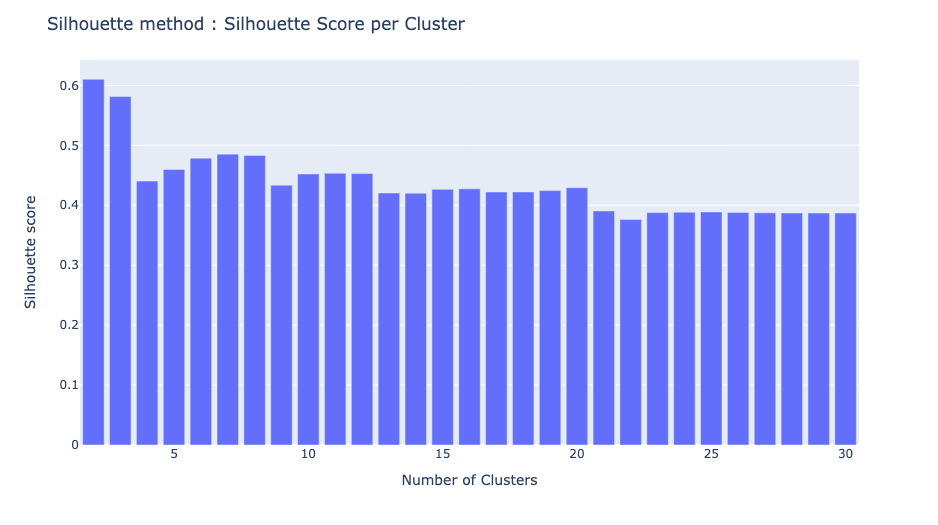

In [7]:
from IPython.display import Image
Image(filename="Graphs/silhouette.png")

### **INTERPRETATION :**

- **Thanks to both Elbow and Silhouette method we can see that the ideal number of cluster will be :**
        Between 3 and 6 clusters
         
        * How can I say that?
        
                - Elbow : we are looking at when the curve is "bending" and forming a "pseudo elbow" meaning that we are trying to minimze inertia (WCSS)
                        * Optimal k cluster between 4 and 9

                - Silhouette : we are searching for the best score optimize the distance between clusters that is to say more the score tend to 1 the better (it means that the observations are assigned to the good cluster and they don't belong to neighborhood clusters)
                        * Optimal k cluster between 3 and 6
                        
        * Again, in unsupervised Machine Learning there no "right answer" it depends on the project goal

        * Here our goal will be to find hot stops for Uber company in order to optimize drivers distances
                - Potentially the firm could make them work in one of those future hot spots so they have to be not to little but not to wide

        * So let's test to map it for clusters between 3 and 6!

## 🔸**Applyling KMeans algorythm for 3 <= k <= 6**

In [151]:
import warnings
warnings.filterwarnings('ignore')

from sklearn.cluster import KMeans

kmeans_3 = KMeans(n_clusters=3, random_state=23)
kmeans_4 = KMeans(n_clusters=4, random_state=23)
kmeans_5 = KMeans(n_clusters=6, random_state=23)
kmeans_6 = KMeans(n_clusters=6, random_state=23)

kmeans_instances = [kmeans_3, kmeans_4, kmeans_5, kmeans_6]

for i in kmeans_instances:
    i.fit(X_normalized)
    print('--------------------------------------------------------')
    print(f'Fitting for {i} : Done')
    print('--------------------------------------------------------')

--------------------------------------------------------
Fitting for KMeans(n_clusters=3, random_state=23) : Done
--------------------------------------------------------
--------------------------------------------------------
Fitting for KMeans(n_clusters=4, random_state=23) : Done
--------------------------------------------------------
--------------------------------------------------------
Fitting for KMeans(n_clusters=6, random_state=23) : Done
--------------------------------------------------------
--------------------------------------------------------
Fitting for KMeans(n_clusters=6, random_state=23) : Done
--------------------------------------------------------


In [152]:
X['cluster_id_3'] = kmeans_3.labels_
X['cluster_id_4'] = kmeans_4.labels_
X['cluster_id_5'] = kmeans_5.labels_
X['cluster_id_6'] = kmeans_6.labels_

X.head()

,Lat,Lon,cluster_id_3,cluster_id_4,cluster_id_5,cluster_id_6
479180,40.7593,-73.9746,2,3,3,3
292487,40.7429,-73.9893,0,3,0,0
267969,40.7664,-73.9788,2,3,3,3
500104,40.7522,-73.9818,2,3,3,3
4303,40.7367,-74.0350,0,0,0,0


## 🔸**We will keep going with k=5**

As explained before this choice is logical because drivers will have to work in zones not too small but not to big

In [202]:
# Creating new dataframe with Day Names for the future visualization

X_with_days = pd.DataFrame(columns = ['Lon', 'Lat', 'cluster_id', 'Day_Name'])

X_with_days['Lon'] = X['Lon']
X_with_days['Lat'] = X['Lat']
X_with_days['cluster_id'] = X['cluster_id_5']
X_with_days['Day_Name'] = uber_april_sample2['Day_Name']

X_with_days.head()

,Lon,Lat,cluster_id,Day_Name
479180,-73.9746,40.7593,3,Monday
292487,-73.9893,40.7429,0,Tuesday
267969,-73.9788,40.7664,3,Monday
500104,-73.9818,40.7522,3,Thursday
4303,-74.0350,40.7367,0,Friday


### 👀 **Let's see on a heatmap cluster center coordinates**

In [203]:
cluster_centers = scaler.inverse_transform(kmeans_4.cluster_centers_)

labels = ['Lon', 'Lat']

matrix = pd.DataFrame(cluster_centers, columns = labels).round(2)

import plotly.figure_factory as ff

colorscale = [[0, '#454D59'],[0.5, '#FFFFFF'], [1, '#F1C40F']]

fig = ff.create_annotated_heatmap(matrix.values,
                                  x = matrix.columns.tolist(),
                                  y = matrix.index.tolist(),
                                  colorscale=colorscale,
                                  showscale=True)

fig.layout.update(go.Layout(
    autosize=False,
    title='HEATMAP : Cluster Coordinates for k=5'
))

fig.show()

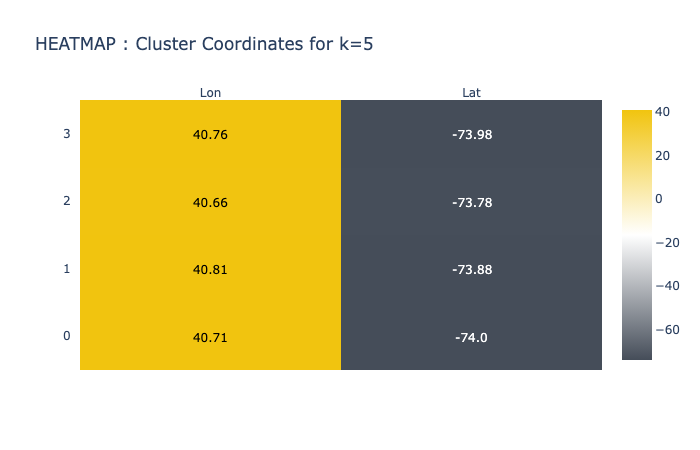

In [8]:
from IPython.display import Image
Image(filename="Graphs/heatmap_coord.png")

In [155]:
cluster_centers

array([[ 40.71383228, -73.99530508],
       [ 40.80527462, -73.8782486 ],
       [ 40.65908537, -73.7830394 ],
       [ 40.75894282, -73.97975856]])

## ♦️ ⇢ **Visualizing clusters centers on a mapbox** 🔍

In [204]:
df_cluster_coordinates = pd.DataFrame(cluster_centers, columns=['Lon', 'Lat'])
clusters_list = [0, 1, 2, 3]
df_cluster_coordinates['Cluster_id'] = clusters_list
df_cluster_coordinates

,Lon,Lat,Cluster_id
0,40.713832,-73.995305,0
1,40.805275,-73.878249,1
2,40.659085,-73.783039,2
3,40.758943,-73.979759,3


### **Looking at hot zones on a map**

In [205]:
fig = px.scatter_mapbox(X_with_days,
                        lat = 'Lat',
                        lon = 'Lon',
                        color='cluster_id',
                        mapbox_style='carto-positron',
                        animation_frame='Day_Name',
                        opacity = 0.8,
                        width=900,
                        height=800,
                        zoom=10,
                        title = 'Daily visualizing 4 Uber Hot Spot in New York City')

fig.show()

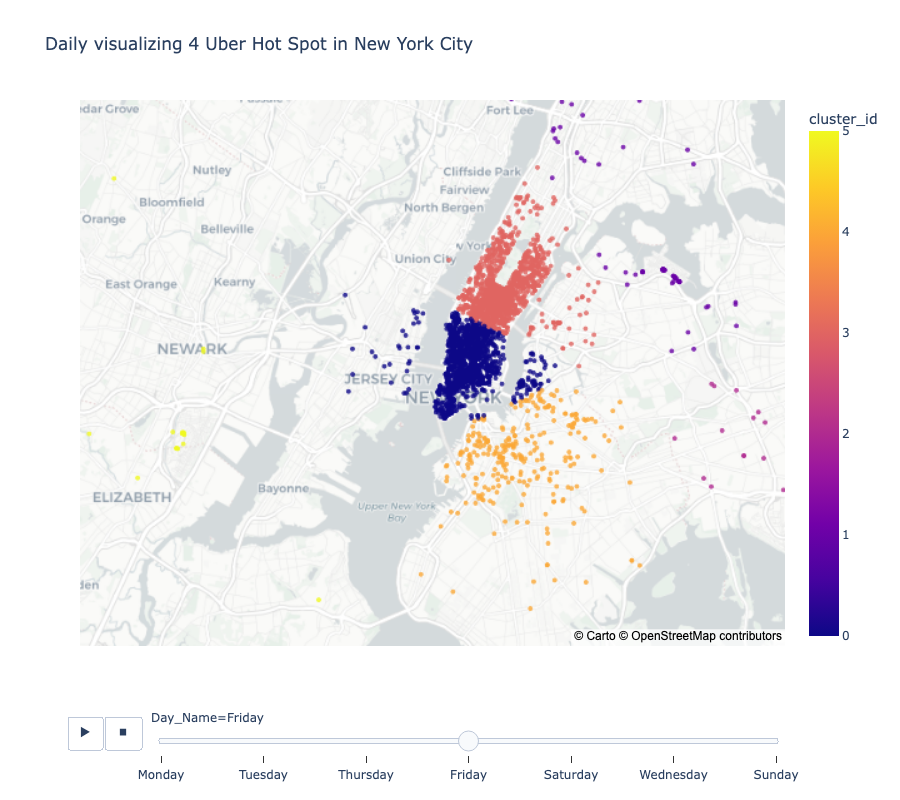

In [10]:
from IPython.display import Image
Image(filename="Graphs/kmeans_map.png")

---


# 🔷 **DBSCAN algorithm** 🤖

---

#### Let's work with another algorythm based on spatial density of observation  in order to optimze our result!
     * In this case we won't have to select the number of clusters but we will have to find to best values for 2 hyperparemeters : epsilon and min_samples

In [158]:
uber_april_sample3 = uber_april.sample(20000)
print('Taking again a sample of the massive original dataset to sample it :', display(uber_april_sample3))
print()

X_DBSCAN = uber_april_sample3.loc[:, ['Lat', 'Lon']]

print('----------------------------------------------------------------------------------')
print()

print('Subsetting the sample keeping coordonates columns :')
print()
display(X_DBSCAN.head())

,Lat,Lon,Time,Year,Month_numeric,Month_Name,Day_Name,Day_numeric,Hour,Minute
446909,40.7607,-73.9803,19:41:00,2014,4,April,Wednesday,2,19,41
531169,40.7254,-73.9875,17:42:00,2014,4,April,Monday,0,17,42
306823,40.7418,-74.0037,02:02:00,2014,4,April,Saturday,5,2,2
428605,40.7296,-74.0022,07:37:00,2014,4,April,Monday,0,7,37
246376,40.7754,-73.9505,07:23:00,2014,4,April,Tuesday,1,7,23
...,...,...,...,...,...,...,...,...,...,...
185677,40.7588,-73.9836,00:21:00,2014,4,April,Sunday,6,0,21
236387,40.7215,-73.9952,13:39:00,2014,4,April,Saturday,5,13,39
377875,40.7469,-73.9909,09:49:00,2014,4,April,Monday,0,9,49
563407,40.6449,-73.7822,16:23:00,2014,4,April,Monday,0,16,23


Taking again a sample of the massive original dataset to sample it : None

----------------------------------------------------------------------------------

Subsetting the sample keeping coordonates columns :



,Lat,Lon
446909,40.7607,-73.9803
531169,40.7254,-73.9875
306823,40.7418,-74.0037
428605,40.7296,-74.0022
246376,40.7754,-73.9505


In [221]:
# Importing and instantiate DBSCAN algorythm
#----------------------------------------------
from sklearn.cluster import DBSCAN

db = DBSCAN(eps= 0.007, min_samples= 300, metric='euclidean', algorithm='brute')
db.fit(X_DBSCAN)

#Creating a new colums and obtaining predictions
#----------------------------------------------
X_DBSCAN['Cluster_id'] = db.labels_

# Let's see that on a mapbox
#----------------------------------------------
fig = px.scatter_mapbox(X_DBSCAN,
                        lat = 'Lat',
                        lon = 'Lon',
                        color='Cluster_id',
                        mapbox_style='carto-positron',
                        opacity = 0.8,
                        width=900,
                        height=800,
                        zoom=10,
                        title = 'DBSCAN : Daily visualizing Uber Hot Spot in New York City')

fig.show('colab')

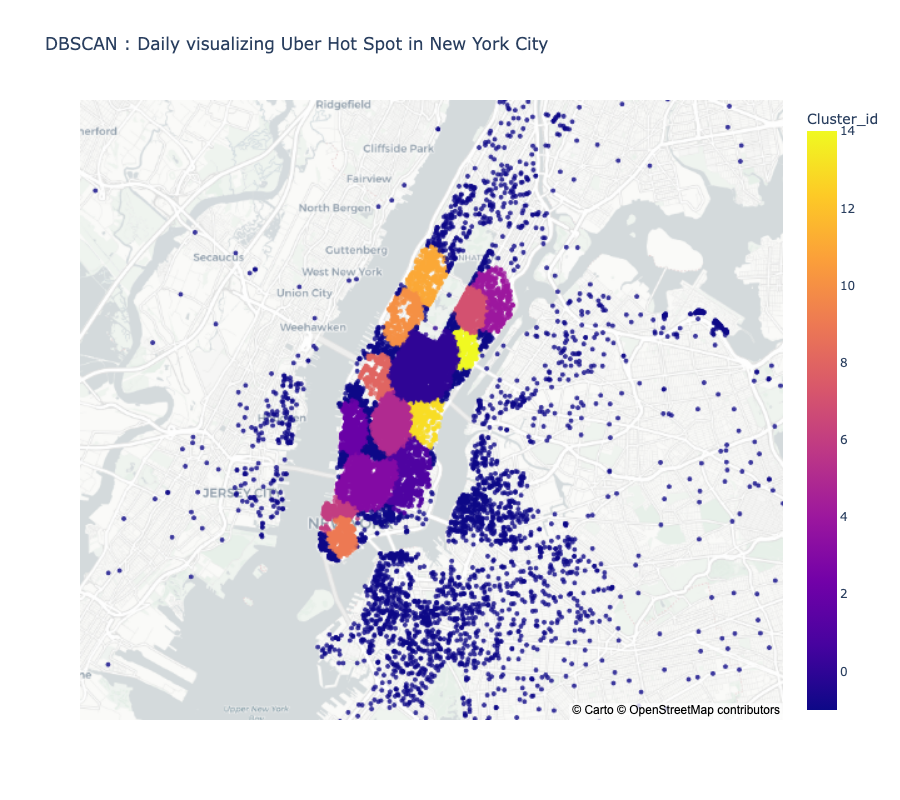

In [11]:
c

In [231]:
# Importing and instantiate DBSCAN algorythm
#----------------------------------------------
from sklearn.cluster import DBSCAN

db = DBSCAN(eps= 0.015, min_samples= 400, metric='euclidean', algorithm='brute')
db.fit(X_DBSCAN)

#Creating a new colums and obtaining predictions
#----------------------------------------------
X_DBSCAN['Cluster_id'] = db.labels_

# Let's see that on a mapbox
#----------------------------------------------
fig = px.scatter_mapbox(X_DBSCAN,
                        lat = 'Lat',
                        lon = 'Lon',
                        color='Cluster_id',
                        mapbox_style='carto-positron',
                        opacity = 0.8,
                        width=900,
                        height=800,
                        zoom=10,
                        title = 'DBSCAN : Daily visualizing Uber Hot Spot in New York City')

fig.show('colab')

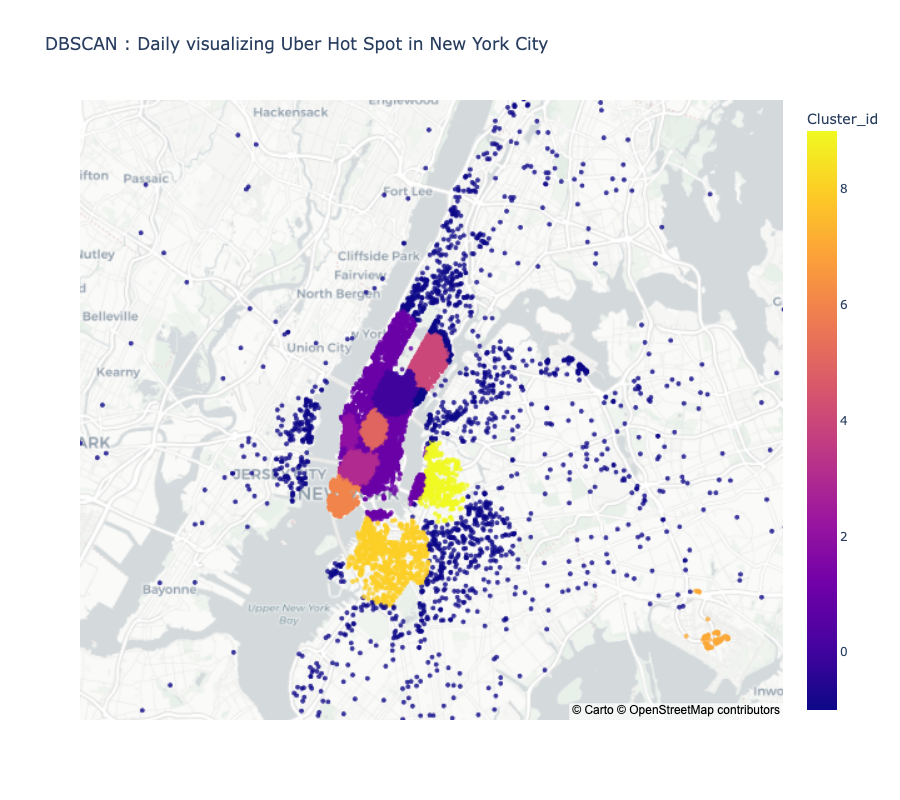

In [12]:
from IPython.display import Image
Image(filename="Graphs/DBSCAN_2.png")